# Categoria

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from create_model import model_pycaret,call_model

In [3]:
dataset = pd.read_csv("../dataset/Toneladas/categoria.csv",index_col=0,parse_dates=["Fecha"])

In [4]:
dataset.head()

,Categoria,Fecha,Toneladas
0,03 Servilletas Masivos,2020-09-07,6.588918e+00
1,10 Toallas Femeninas,2019-12-09,5.568157e+06
2,03 Servilletas Masivos,2021-03-12,6.567588e+00
3,11 Toallas Húmedas,2021-05-11,2.655348e+06
4,04 Pañuelos Masivos,2020-06-23,1.607170e-01


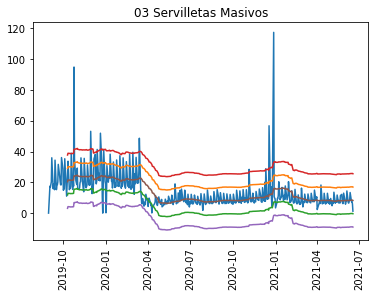

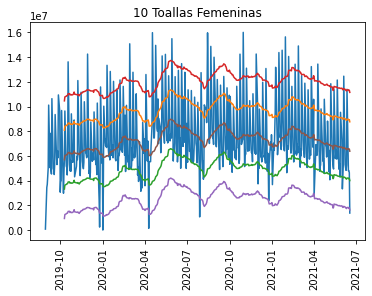

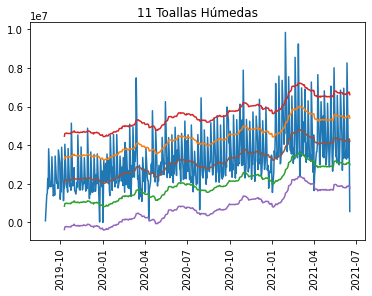

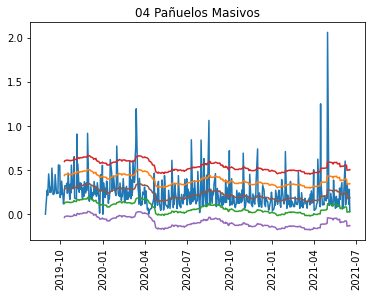

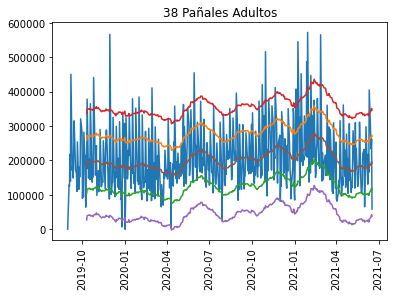

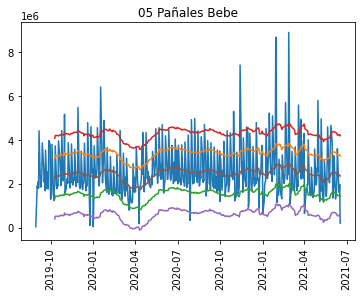

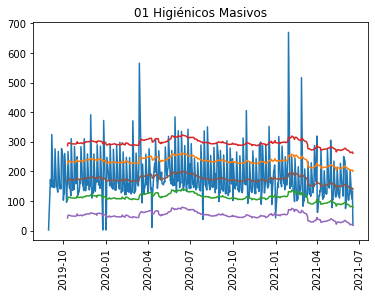

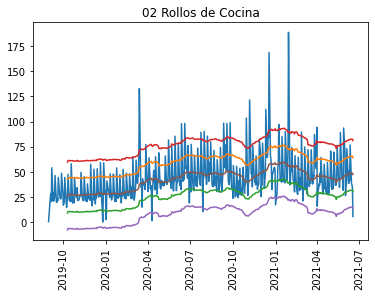

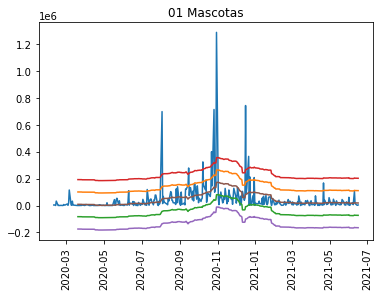

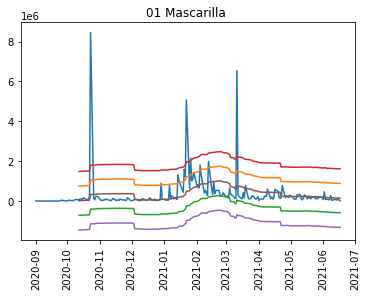

In [6]:
for i in dataset.Categoria.unique():
    subset = dataset[dataset['Categoria']==i].drop('Categoria',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [7]:
model_pycaret(dataset,target="Toneladas",level="Categoria")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.7871,0.9885,0.9943,0.3695,0.0745,0.0649
1,1.0347,1.6934,1.3013,-0.1854,0.1007,0.0882
2,0.7103,0.8363,0.9145,0.4284,0.0703,0.0588
3,0.7805,1.0686,1.0337,0.2078,0.0794,0.0663
4,0.8977,1.2023,1.0965,0.3055,0.0831,0.0739
5,0.9352,1.7084,1.3071,0.2570,0.0992,0.0791
6,0.6876,0.8826,0.9394,0.3889,0.0713,0.0564
7,0.7654,1.0886,1.0433,0.2614,0.0732,0.0597
8,0.8880,1.1997,1.0953,0.3874,0.0845,0.0738
9,0.9686,1.2853,1.1337,-0.0365,0.0854,0.0768


In [8]:
concat_df = call_model(dataset,target="Toneladas",level="Categoria")

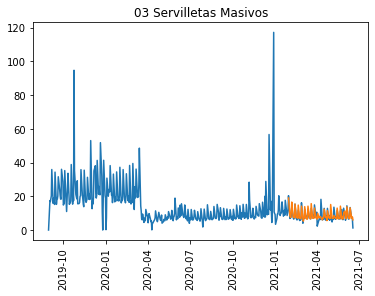

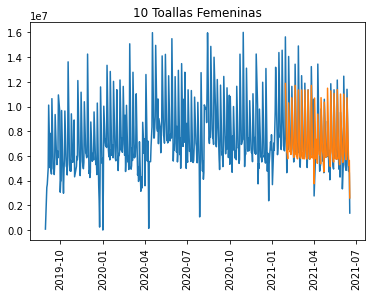

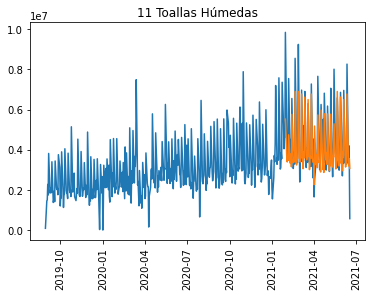

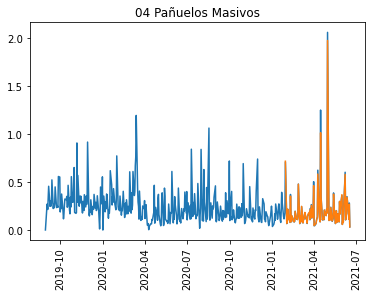

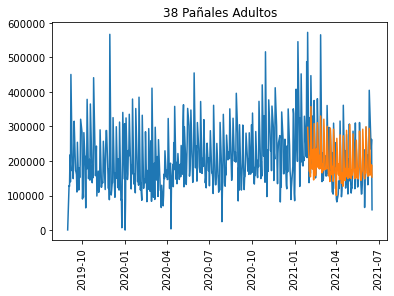

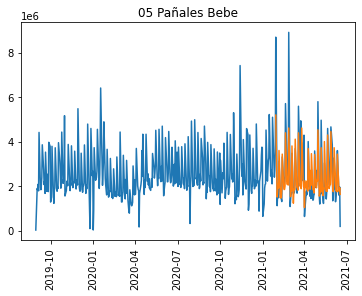

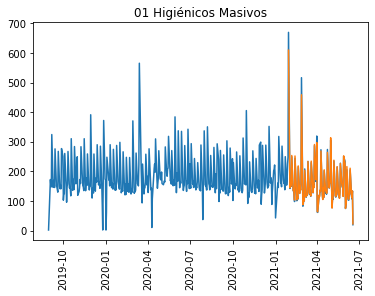

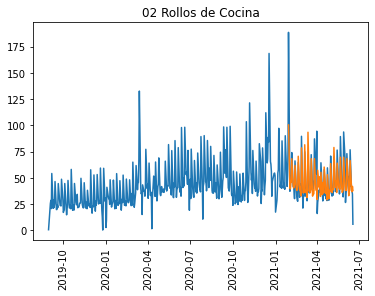

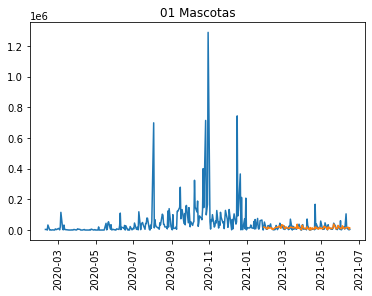

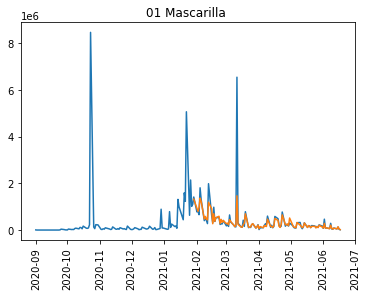

In [9]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Categoria'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Localidad

In [12]:
dataset = pd.read_csv("../dataset/Toneladas/localidad.csv",index_col=0,parse_dates=["Fecha"])

In [13]:
dataset

,Localidad,Fecha,Toneladas
0,AMAZONAS,2019-10-01,11232.642443
1,AMAZONAS,2019-10-02,2400.034635
2,AMAZONAS,2019-10-03,3400.044209
3,AMAZONAS,2019-10-04,18480.385085
4,AMAZONAS,2019-10-05,6912.031864
...,...,...,...
13318,UCAYALI,2021-06-12,79018.284437
13319,UCAYALI,2021-06-14,139661.399606
13320,UCAYALI,2021-06-15,38722.118431
13321,UCAYALI,2021-06-16,79525.032052


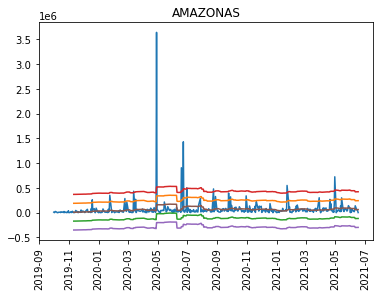

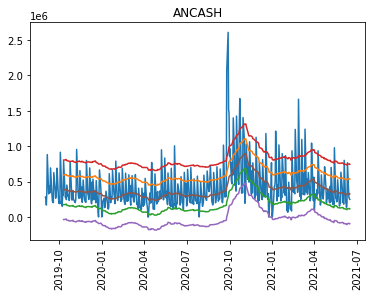

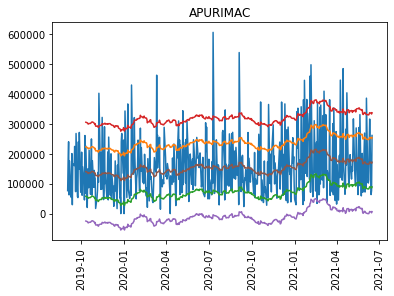

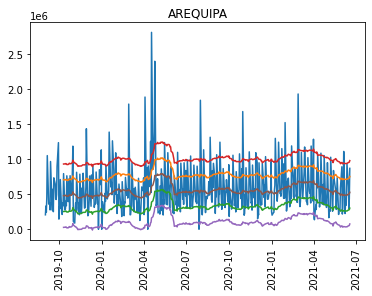

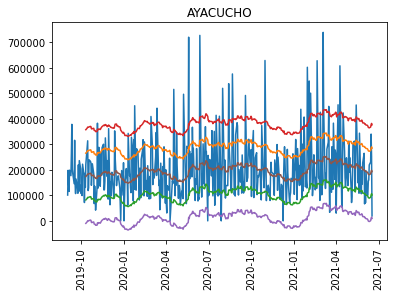

...

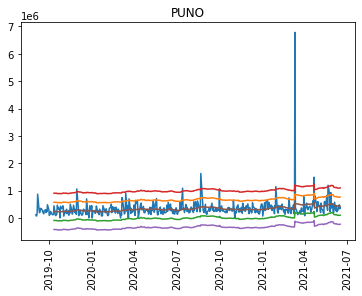

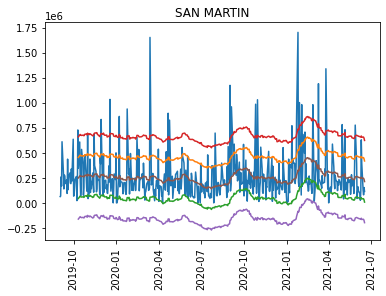

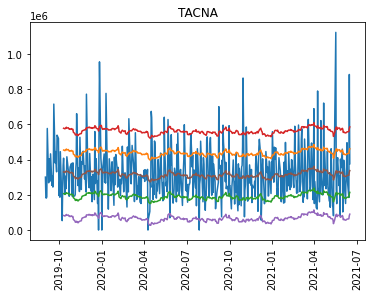

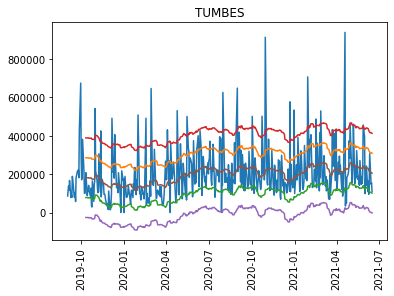

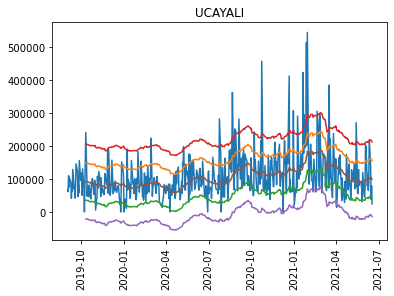

In [14]:
for i in dataset.Localidad.unique():
    subset = dataset[dataset['Localidad']==i].drop('Localidad',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [15]:
model_pycaret(dataset,target="Toneladas",level="Localidad")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3974,0.2492,0.4992,0.0240,0.0398,0.0344
1,0.5098,0.4297,0.6555,-0.1203,0.0539,0.0457
2,0.4290,0.3791,0.6157,-0.0253,0.0507,0.0385
3,0.4376,0.3315,0.5758,-0.0415,0.0453,0.0375
4,0.3947,0.2960,0.5440,0.2570,0.0456,0.0360
5,0.3428,0.1910,0.4371,-0.0244,0.0355,0.0306
6,0.3879,0.2897,0.5383,-0.0289,0.0436,0.0340
7,0.3681,0.2215,0.4706,-0.0168,0.0381,0.0328
8,0.5986,0.5427,0.7367,-0.1781,0.0598,0.0530
9,0.4825,0.4428,0.6654,0.0591,0.0522,0.0407


In [16]:
concat_df = call_model(dataset,target="Toneladas",level="Localidad")

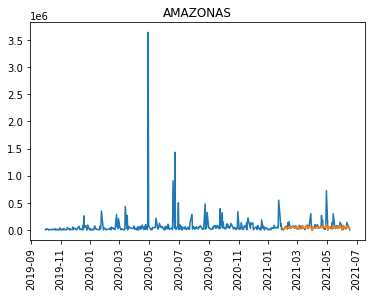

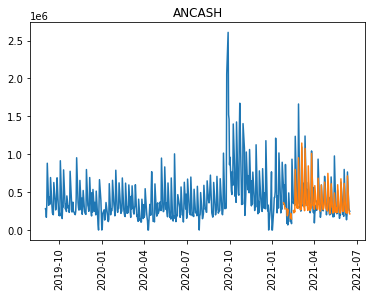

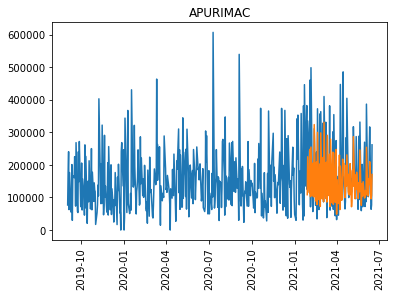

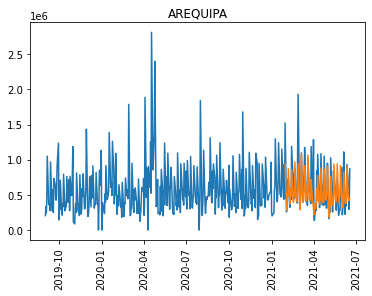

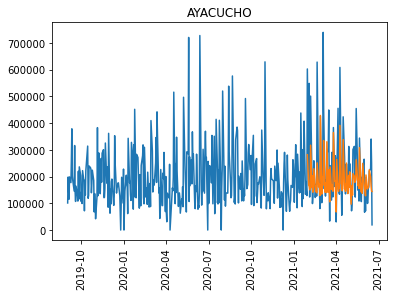

...

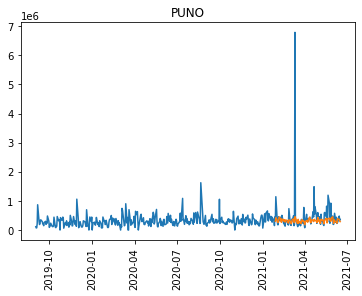

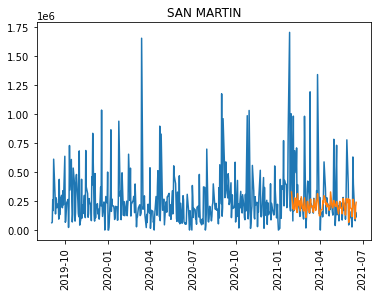

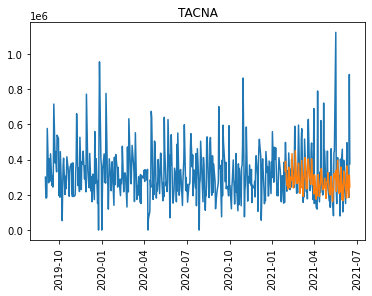

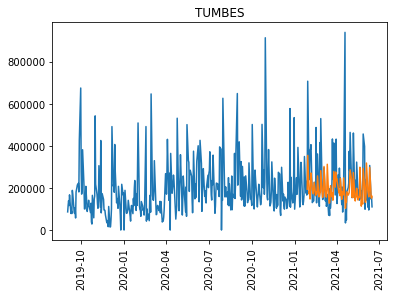

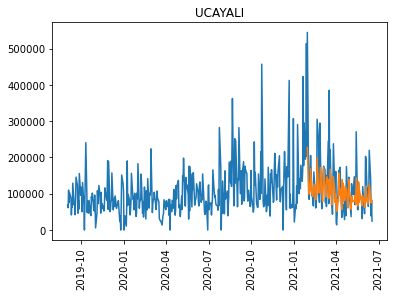

In [17]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Localidad'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Marca

In [18]:
dataset = pd.read_csv("../dataset/Toneladas/marca.csv",index_col=0,parse_dates=["Fecha"])

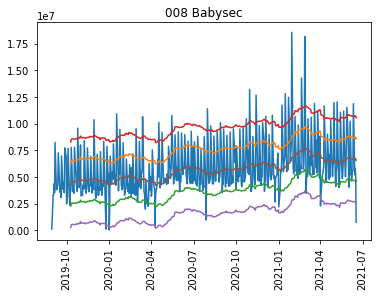

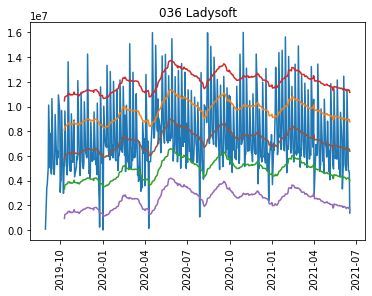

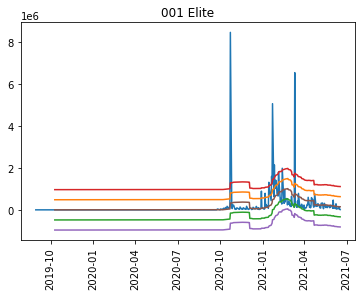

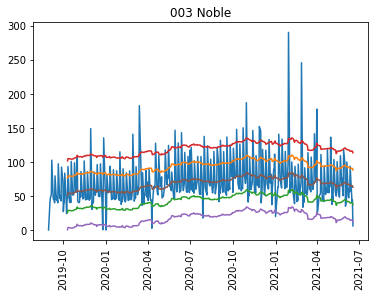

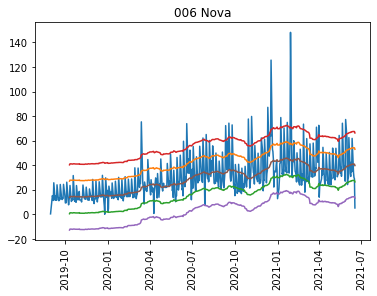

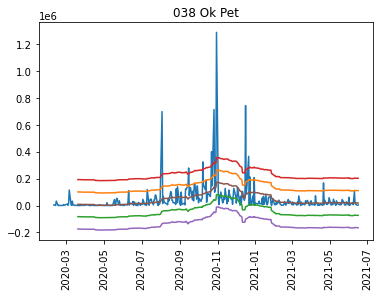

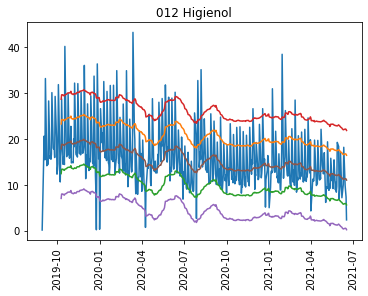

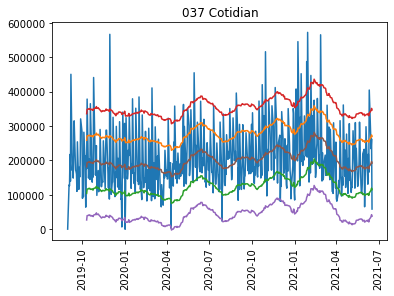

In [19]:
for i in dataset.Marca.unique():
    subset = dataset[dataset['Marca']==i].drop('Marca',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [20]:
model_pycaret(dataset,target="Toneladas",level="Marca")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3542,0.2776,0.5268,0.2992,0.0416,0.0301
1,0.2285,0.0854,0.2923,0.3497,0.0223,0.0188
2,0.3073,0.1297,0.3602,0.1506,0.0273,0.0252
3,0.2859,0.1645,0.4056,-0.6469,0.0311,0.0237
4,0.3908,0.6494,0.8059,0.1548,0.0716,0.0377
5,0.2507,0.1068,0.3269,0.1953,0.0251,0.0206
6,0.2811,0.1154,0.3397,0.3383,0.0265,0.0238
7,0.2241,0.1090,0.3301,0.3417,0.0255,0.0187
8,0.3338,0.1947,0.4413,-0.0056,0.0336,0.0276
9,0.3042,0.1551,0.3938,0.1506,0.0307,0.0256


In [21]:
concat_df = call_model(dataset,target="Toneladas",level="Marca")

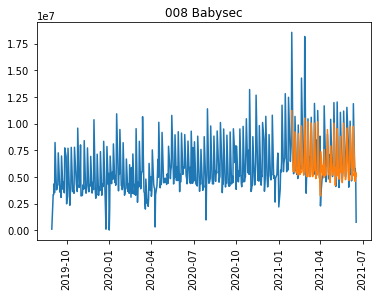

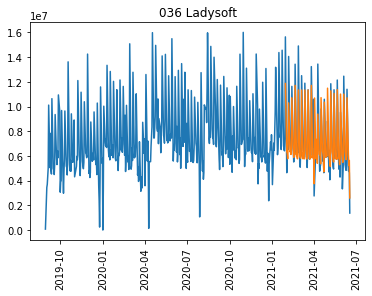

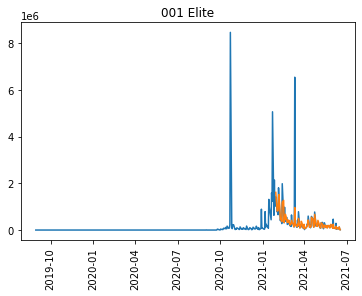

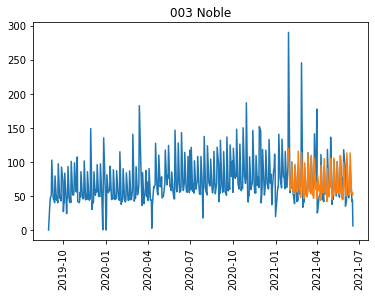

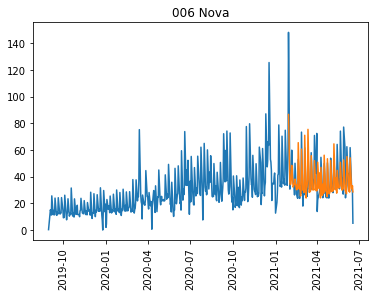

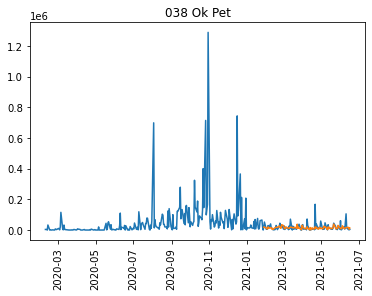

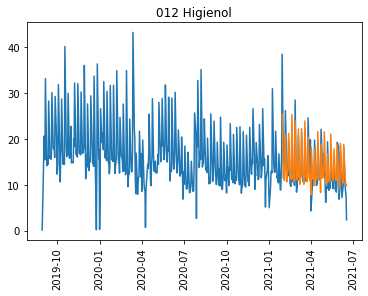

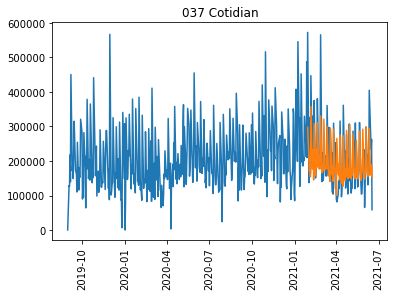

In [22]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Marca'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Nombre Distribuidora

In [24]:
dataset = pd.read_csv("../dataset/Toneladas/distribuidor.csv",index_col=0,parse_dates=["Fecha"])

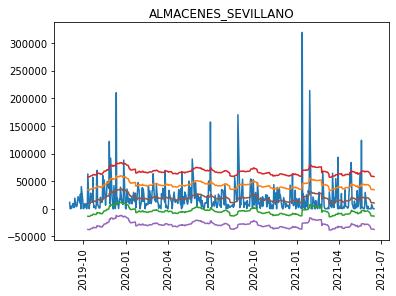

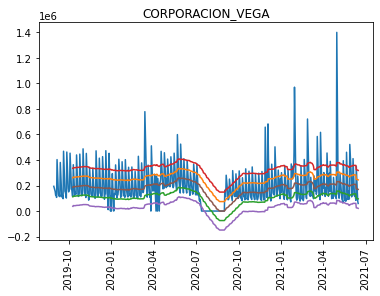

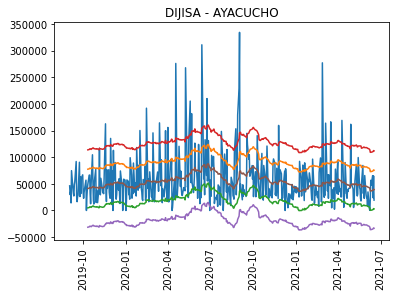

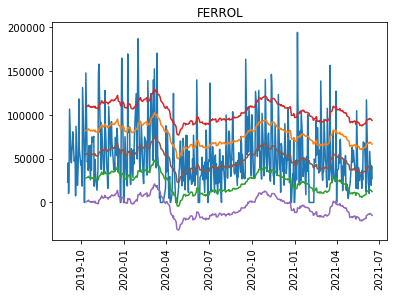

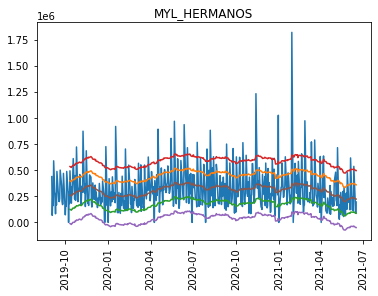

...

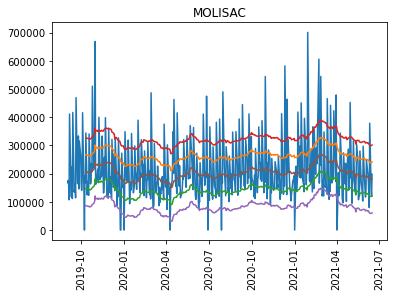

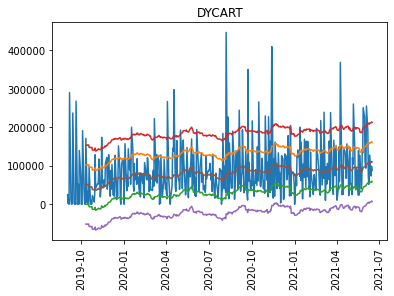

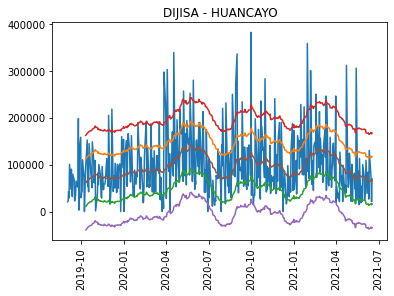

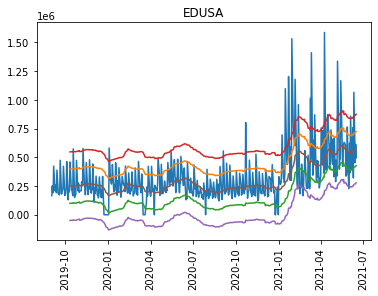

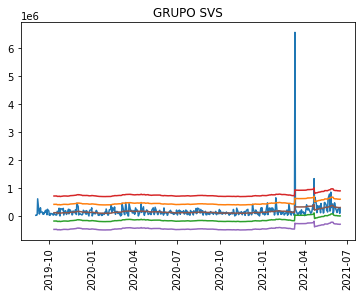

In [25]:
for i in dataset.Nombre_dist.unique():
    subset = dataset[dataset['Nombre_dist']==i].drop('Nombre_dist',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [26]:
model_pycaret(dataset,target="Toneladas",level="Nombre_dist")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.5996,0.5530,0.7437,-0.1287,0.0595,0.0521
1,0.5988,0.5702,0.7551,0.1672,0.0608,0.0531
2,0.5999,0.5552,0.7451,0.2116,0.0582,0.0497
3,0.6046,0.5754,0.7586,0.0605,0.0610,0.0530
4,0.5950,0.5731,0.7570,-0.1740,0.0606,0.0519
5,0.5222,0.4466,0.6683,-0.0079,0.0541,0.0464
6,0.5011,0.3762,0.6134,0.2605,0.0494,0.0440
7,0.5866,0.5134,0.7165,-0.2248,0.0562,0.0495
8,0.6445,0.6472,0.8045,0.2489,0.0619,0.0545
9,0.4909,0.3618,0.6015,0.1807,0.0470,0.0413


In [27]:
concat_df = call_model(dataset,target="Toneladas",level="Nombre_dist")

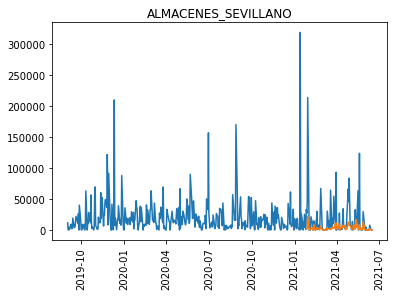

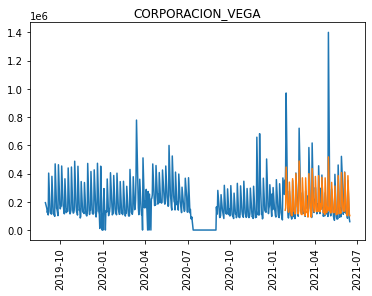

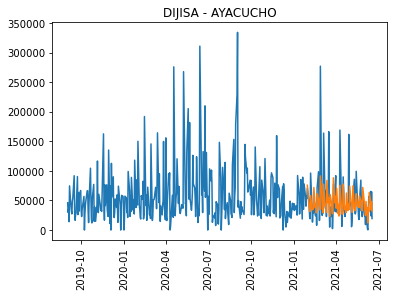

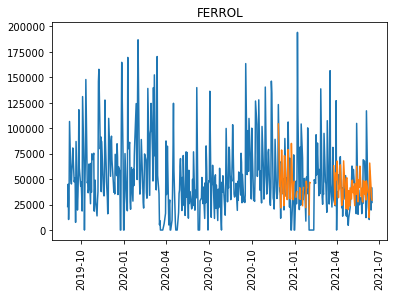

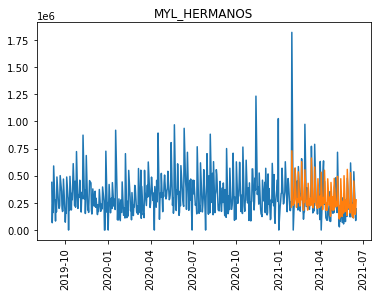

...

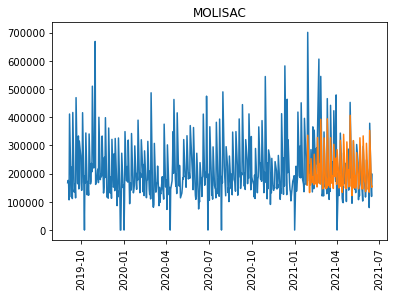

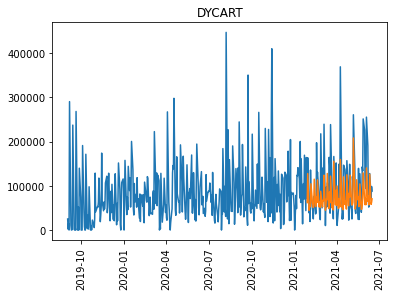

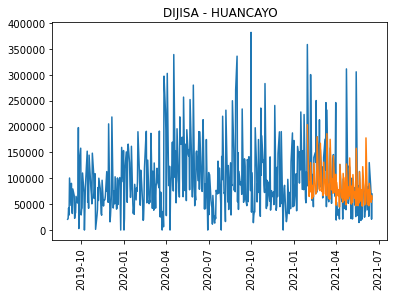

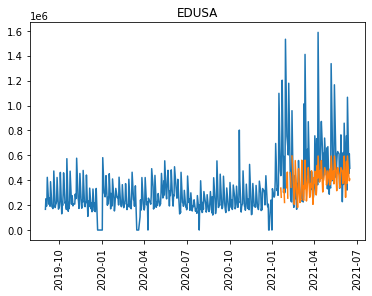

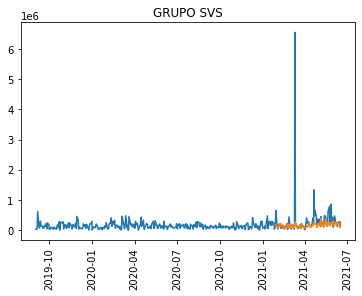

In [28]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Nombre_dist'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Region

In [30]:
dataset = pd.read_csv("../dataset/Toneladas/region.csv",index_col=0,parse_dates=["Fecha"])

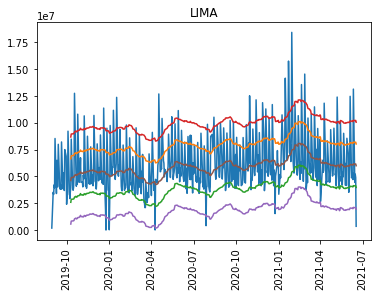

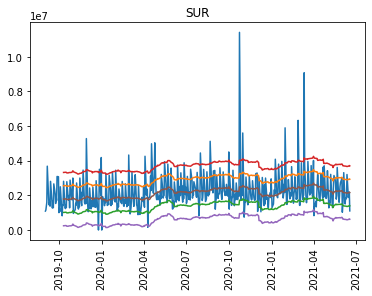

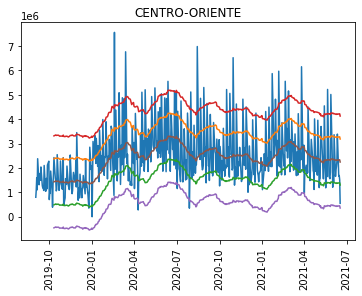

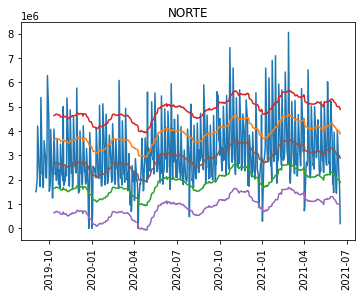

In [31]:
for i in dataset.Region.unique():
    subset = dataset[dataset['Region']==i].drop('Region',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [32]:
model_pycaret(dataset,target="Toneladas",level="Region")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2675,0.1632,0.4040,0.2479,0.0265,0.0185
1,0.1930,0.0841,0.2901,0.4775,0.0189,0.0132
2,0.3387,0.2100,0.4583,0.0922,0.0291,0.0230
3,0.1620,0.0456,0.2135,0.6602,0.0133,0.0108
4,0.3725,0.2627,0.5126,0.1992,0.0328,0.0255
5,0.2139,0.0955,0.3090,-0.0927,0.0194,0.0143
6,0.2575,0.1292,0.3595,0.0629,0.0231,0.0175
7,0.1990,0.0655,0.2560,0.5227,0.0162,0.0133
8,0.3723,0.5405,0.7352,-0.1665,0.0498,0.0275
9,0.2240,0.0940,0.3065,0.6056,0.0197,0.0153


In [33]:
concat_df = call_model(dataset,target="Toneladas",level="Region")

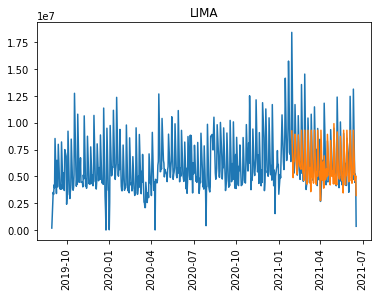

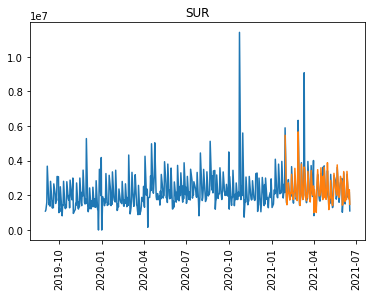

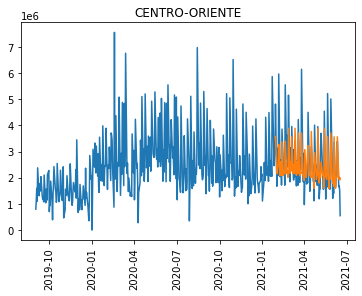

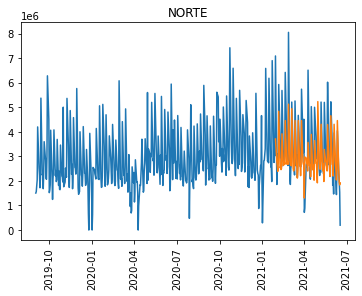

In [34]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Region'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# SKU

In [35]:
dataset = pd.read_csv("../dataset/Toneladas/sku.csv",index_col=0,parse_dates=["Fecha"])

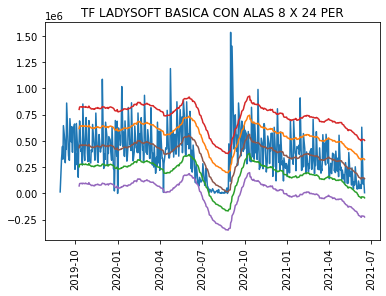

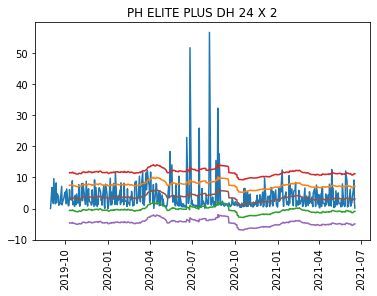

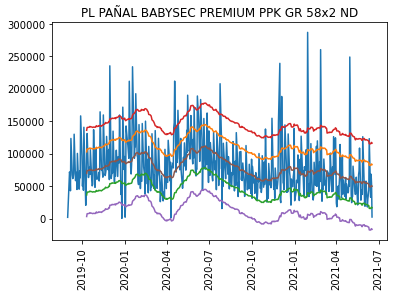

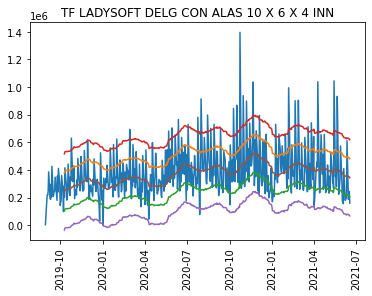

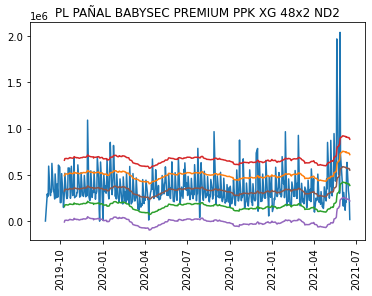

...

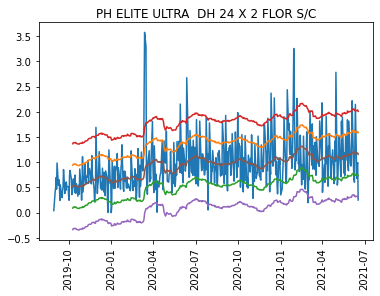

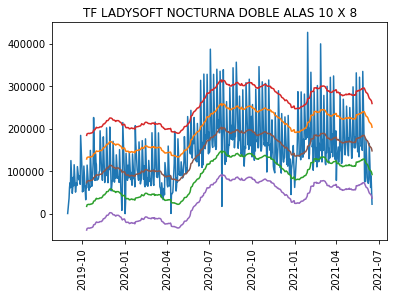

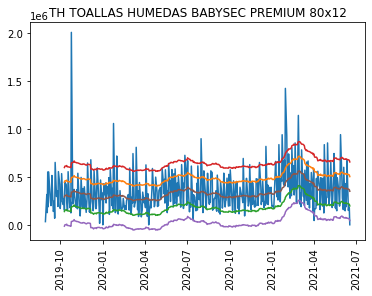

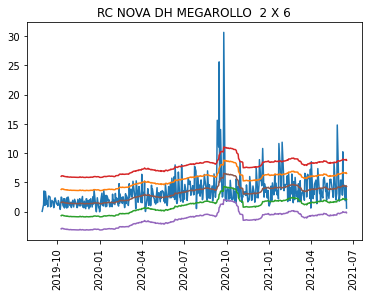

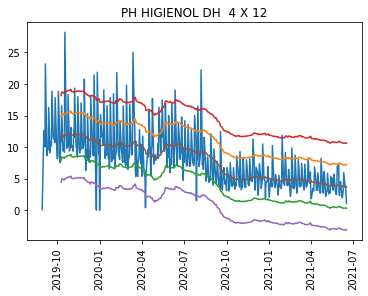

In [36]:
for i in dataset.SKU.unique():
    subset = dataset[dataset['SKU']==i].drop('SKU',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [37]:
model_pycaret(dataset,target="Toneladas",level="SKU")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2619,0.1483,0.3851,0.5745,0.1591,0.2278
1,0.2093,0.0727,0.2696,0.7051,0.1053,0.1395
2,0.2085,0.0565,0.2377,0.6618,0.0871,0.1229
3,0.2245,0.0674,0.2596,0.7382,0.0981,0.1396
4,0.3414,0.3485,0.5903,0.4086,0.1409,0.2671
5,0.2229,0.0733,0.2707,0.7708,0.1047,0.1472
6,0.2020,0.0948,0.3079,0.4393,0.1272,0.1527
7,0.2558,0.1285,0.3584,0.6369,0.1730,0.5645
8,0.2722,0.1582,0.3978,0.5694,0.1646,0.2325
9,0.2939,0.1224,0.3499,0.3706,0.1255,0.1647


In [38]:
concat_df = call_model(dataset,target="Toneladas",level="SKU")

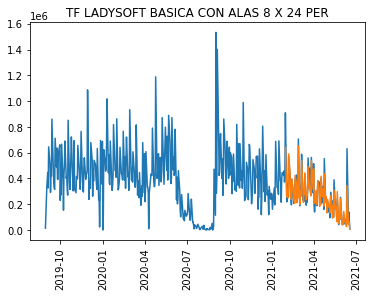

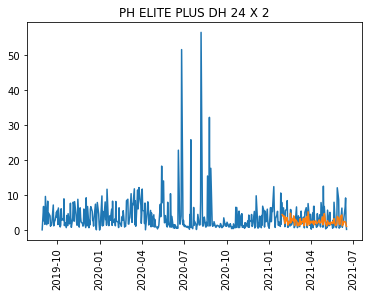

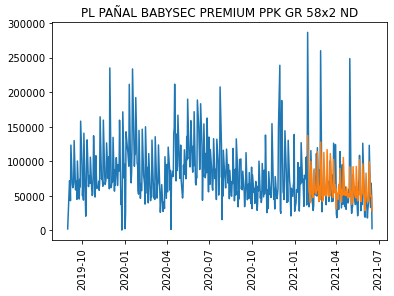

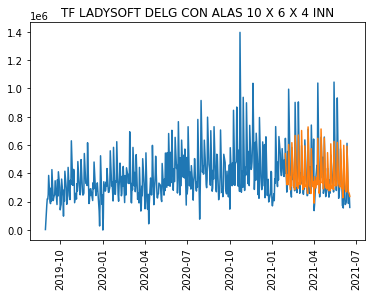

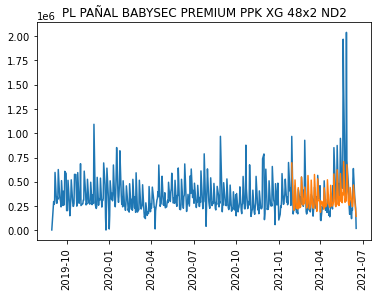

...

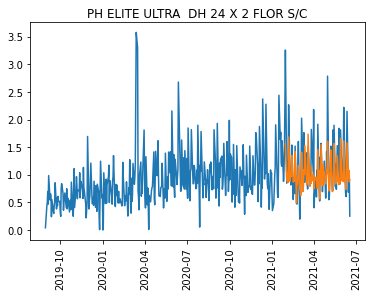

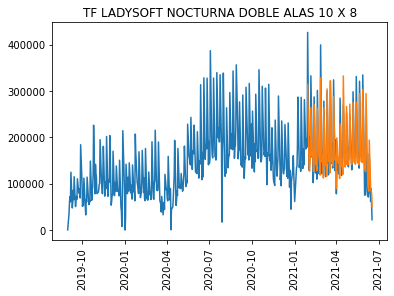

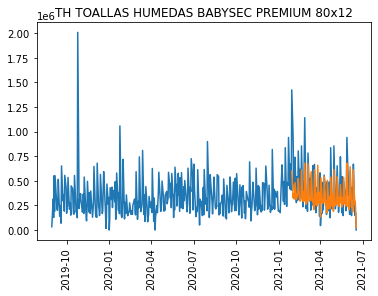

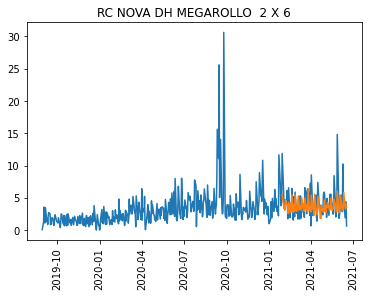

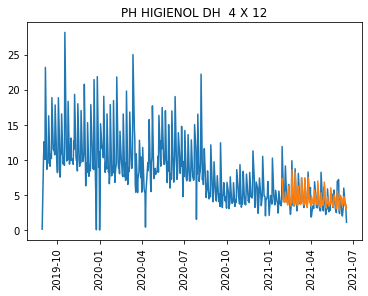

In [39]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['SKU'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()